<a href="https://colab.research.google.com/github/Joseun/Hamoye/blob/master/Hamoye_Premier_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### IMPORTING LIBRARIES

In [115]:
# Importing required libraries
import collections
import re
import nltk
import numpy as np
import missingno as msno
import pandas as pd
import seaborn as sns
import matplotlib.cm as cm
import matplotlib.pyplot as plt
from matplotlib import rcParams
from google.colab import files
from nltk.corpus import stopwords
from pandas_profiling import ProfileReport
from wordcloud import WordCloud, STOPWORDS

# Setting seaborn style
sns.set()
%matplotlib inline

#nltk.download('stopwords')
#nltk.download('punkt')
#nltk.download('wordnet')

### IMPORTING DATASET

In [2]:
# Downloading the dataset from google drive
! gdown --id 1ex3oIOgefqLy-xjcvRzQ1zgCj_5k2jrv

Downloading...
From: https://drive.google.com/uc?id=1ex3oIOgefqLy-xjcvRzQ1zgCj_5k2jrv
To: /content/data job posts.csv
100% 96.0M/96.0M [00:00<00:00, 131MB/s]


In [ ]:
# Creating a panda dataframe which will be use as raw data for reference
online_job_data = pd.read_csv('/content/data job posts.csv')
online_job_data

### EXPLORATORY DATA ANALYSIS

In [ ]:
# Installing panda profiling requirements into my google collab
! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

In [11]:
# Using panda profile to get an overview of the data
profile = ProfileReport(online_job_data, title="Online Job Dataset", html={'style': {'full_width': True}}, sort=None)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
# Check additional information about the dataframe

online_job_data.info()

### DATA CLEANING

In [4]:
# list of all the columns in the data
print (online_job_data.columns)

# Renaming the columns correctly
online_job_data = online_job_data.rename(columns = {
    "JobRequirment": "Job_Requirement",
    "RequiredQual": "Required_Qualification",
    "ApplicationP": "Application_Procedure",
     "AboutC" : "About_Company",
    'AnnouncementCode' : 'Announcement_Code',
    'OpeningDate' : 'Opening_Date',
    'JobDescription' : 'Job_Description',
    'OpeningDate' : 'Opening_Date',
    'StartDate' : 'Start_Date'
})

online_job_data.columns

Index(['jobpost', 'date', 'Title', 'Company', 'AnnouncementCode', 'Term',
       'Eligibility', 'Audience', 'StartDate', 'Duration', 'Location',
       'JobDescription', 'JobRequirment', 'RequiredQual', 'Salary',
       'ApplicationP', 'OpeningDate', 'Deadline', 'Notes', 'AboutC', 'Attach',
       'Year', 'Month', 'IT'],
      dtype='object')


Index(['jobpost', 'date', 'Title', 'Company', 'Announcement_Code', 'Term',
       'Eligibility', 'Audience', 'Start_Date', 'Duration', 'Location',
       'Job_Description', 'Job_Requirement', 'Required_Qualification',
       'Salary', 'Application_Procedure', 'Opening_Date', 'Deadline', 'Notes',
       'About_Company', 'Attach', 'Year', 'Month', 'IT'],
      dtype='object')

From the EDA, some hypothesis about the dataset were made.
1. Jobpost column was extracted from various sources and was processed to create other columns. 
2. Since jobpost was extracted from various sources there are repeated entries of similar jobposts in its columns. 
3. Consequently, jobposts from the same company posted in the same year and month are duplicated.

Testing Hypothesis 1 - TRUE

In [ ]:
online_job_data.iloc[0][0]

In [ ]:
online_job_data.iloc[0]

Testing Hypothesis 2 - TRUE

In [21]:
duplicated = online_job_data.duplicated().sum()
if duplicated:
    print('Duplicate rows in Dataset are {}'.format(duplicated))
else:
    print('Dataset contains no duplicate values')

Duplicate rows in Dataset are 39


In [22]:
for i in online_job_data.columns:
  duplicated_data = online_job_data[i].duplicated().sum()
  unique_values = online_job_data[i].nunique()
  if duplicated_data:
    print('Duplicate rows in dataset at {} column are {} with {} unique items'.format(i, duplicated_data, unique_values))
  else: 
    print('Dataset contains no duplicate values in {}'.format(i))

Duplicate rows in dataset at jobpost column are 109 with 18892 unique items
Duplicate rows in dataset at date column are 14610 with 4391 unique items
Duplicate rows in dataset at Title column are 10364 with 8636 unique items
Duplicate rows in dataset at Company column are 14446 with 4554 unique items
Duplicate rows in dataset at AnnouncementCode column are 17986 with 1014 unique items
Duplicate rows in dataset at Term column are 18589 with 411 unique items
Duplicate rows in dataset at Eligibility column are 18337 with 663 unique items
Duplicate rows in dataset at Audience column are 18784 with 216 unique items
Duplicate rows in dataset at StartDate column are 17814 with 1186 unique items
Duplicate rows in dataset at Duration column are 17485 with 1515 unique items
Duplicate rows in dataset at Location column are 18241 with 759 unique items
Duplicate rows in dataset at JobDescription column are 6139 with 12861 unique items
Duplicate rows in dataset at JobRequirment column are 4818 with 

Testing Hypothesis 3 - TRUE

In [17]:
multiple = online_job_data[['Year', 'Month', 'Company', 'Title', 'jobpost']]
multiple.duplicated().sum()

83

Since all hypothesis are true, we can clean by removing duplicates sequentially

### DROPPING DUPLICATE ROWS

In [5]:
print(online_job_data.shape)
online_job_data = online_job_data.drop_duplicates()
print(online_job_data.shape)
online_job_data= online_job_data.drop_duplicates('jobpost', keep='first')
print(online_job_data.shape)
online_job_data = online_job_data.drop_duplicates(subset=['Year', 'Month', 'Company', 'Title'])
print(online_job_data.shape)

(19001, 24)
(18962, 24)
(18892, 24)
(18552, 24)


In [25]:
for i in online_job_data.columns:
  duplicated_data = online_job_data[i].duplicated().sum()
  unique_values = online_job_data[i].nunique()
  if duplicated_data:
    print('Duplicate rows in dataset at {} column are {} with {} unique items'.format(i, duplicated_data, unique_values))
  else: 
    print('Dataset contains no duplicate values in {}'.format(i))

Dataset contains no duplicate values in jobpost
Duplicate rows in dataset at date column are 14187 with 4365 unique items
Duplicate rows in dataset at Title column are 9915 with 8636 unique items
Duplicate rows in dataset at Company column are 13997 with 4554 unique items
Duplicate rows in dataset at AnnouncementCode column are 17544 with 1007 unique items
Duplicate rows in dataset at Term column are 18141 with 410 unique items
Duplicate rows in dataset at Eligibility column are 17889 with 662 unique items
Duplicate rows in dataset at Audience column are 18335 with 216 unique items
Duplicate rows in dataset at StartDate column are 17371 with 1180 unique items
Duplicate rows in dataset at Duration column are 17039 with 1512 unique items
Duplicate rows in dataset at Location column are 17803 with 748 unique items
Duplicate rows in dataset at JobDescription column are 5744 with 12807 unique items
Duplicate rows in dataset at JobRequirment column are 4439 with 14112 unique items
Duplicate 

### THE DEMAND FOR CERTAIN PROFESSIONS AND JOB TITLES

Working towards demand for certain professions and titles, the columns with the required information are Title, IT, Month, Year.

In [ ]:
# making a copy of job_title for manipulation and reference
job_demand = online_job_data[['Year', 'Month', 'Title', 'IT']]
job_demand

HANDLING MISSING DATA

Year      0
Month     0
Title    19
IT        0
dtype: int64


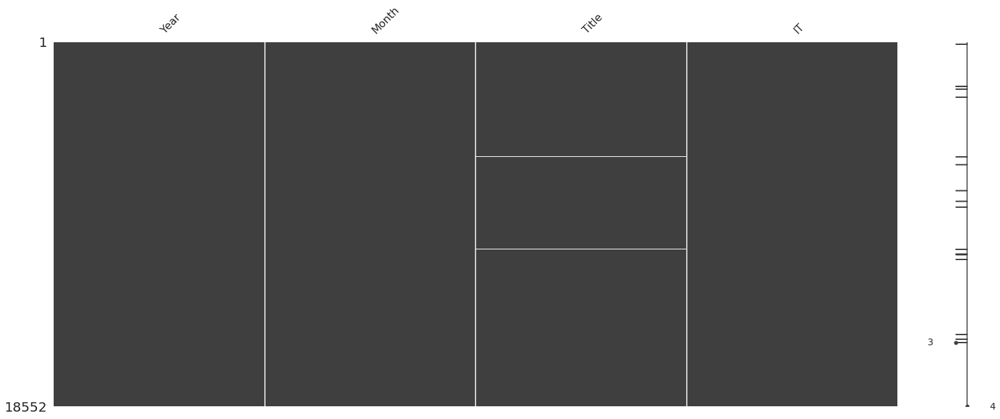

In [34]:
# Visualizing missing data
print (job_demand.isnull().sum())
msno.matrix(job_demand)

In [32]:
print(job_demand.shape)
job_demand = job_demand.dropna(subset = ['Title'])
print(job_demand.shape)
job_demand.isnull().sum()

(18552, 4)
(18533, 4)


Year     0
Month    0
Title    0
IT       0
dtype: int64

In [ ]:
# using panda profile to get an overview of the job demand data and also see any errors in the cleaning
profile = ProfileReport(job_demand, title="Job Demand", html={'style': {'full_width': True}}, sort=None)
profile.to_notebook_iframe()

Top 30 jobs between 2004 and 2015 - Accountant positions were highly demand for over the years.

In [ ]:
top_30 = job_demand['Title'].value_counts().head(30)
top_30.to_csv("Top30.csv")
files.download("Top30.csv")

Demand of jobs per year from largest to smallest - 2012 had the highest demand for jobs

In [ ]:
job_demand['Year'].value_counts()

Top job per year - Accountants were mostly demanded for over many years, though there was greater demand for Medical Representatives in some years

In [ ]:
top_jobs_by_year = job_demand.groupby('Year')['Title'].describe()
top_jobs_by_year
top_jobs_by_year.to_csv("Top_jobs_yearly.csv")
#files.download("Top_jobs_yearly.csv")

Top 5 jobs per year

In [ ]:
all_jobs_by_year = job_demand.groupby('Year')['Title'].value_counts()
# There are over 12258 rows in this result, so it would be difficult getting each year, so we a function was made to extract the rows and make it into a panda DataFrame

all_jobs_by_year.to_csv("all_jobs_by_year.csv")
files.download("all_jobs_by_year.csv")
all_jobs_by_year

In [ ]:
""" Function to extract the top n items from a groupby aggregation """
import operator

def count_title(groupby_object):
  titlelist = []
  for row in groupby_object:
    titlelist.append(row)
  # print (titlelist)
  unordered = {x:titlelist.count(x) for x in titlelist}
  # print ('@@@@')
  # print (unordered)
  ordered = dict( sorted(unordered.items(), key=operator.itemgetter(1), reverse=True))
  # print ('%%%%')
  # print (ordered)
  topitems = {A:N for (A,N) in [x for x in ordered.items()][:5]}# [:5] gives the top 5 key-value pairs
  twopitems = dict( sorted(topitems.items(), key=operator.itemgetter(1), reverse=True))
  # print (topitems)
  return (topitems)

""" Function to extract the element in the Dataframe object and assign then to specified columns """

def create_table(group):
  # print (group)
  toplist = []
  for k, v in group.items():
    # print ('{} '':'' {}'.format(k, v)) 
    toplist.append([k[0], k[1], v])
  toptitles = pd.DataFrame(toplist, columns =['Year', 'Title', 'Count'])
  return (toptitles)

In [ ]:
# jobs not in the top 5 were return with a count of NaN
top_5_jobs = job_demand.groupby('Year')['Title'].apply(count_title)
print (top_5_jobs.head(8))
top_5_jobs = top_5_jobs.dropna()
top_5_jobs.to_csv("Top5_jobs_yearly.csv")
files.download("Top5_jobs_yearly.csv")
top_5_jobs

# top_5_jobs

In [ ]:
# To make the data into a table for ease of visualiztion

top_5_jobs = pd.DataFrame(top_5_jobs) # The Dataframe with a single column as Title with key as Year and object of format (2004, 'Accountant') : 16.0
print (top_5_jobs.head(8))
top_5_jobs_per_year = create_table(top_5_jobs['Title'])
top_5_jobs_per_year.to_csv("Top_5_Jobs_Yearly")
top_5_jobs_per_year


In [ ]:
sns.countplot(x="Title", hue=None, data=top_5_jobs_per_year)
plt.gcf().set_size_inches(50, 20)

Demand for IT jobs by year

In [ ]:
IT_jobs = job_demand.groupby('Year')['IT'].value_counts()
IT_jobs.to_csv("IT_trend.csv")
files.download("IT_trend.csv")
IT_jobs

In [35]:
IT_jobs.plot(kind='line')

NameError: ignored

### TEXT DATA PROCESSING FUNCTIONS

In [141]:
## Creating corpus
def process_text(df2):
  corpus = []
  for i in range(0, len(df2)):
    job_clean2 = re.sub(r'\W', ' ', str(df2[i]))
    job_clean2 = job_clean2.lower()
    job_clean2 = re.sub(r'^br$', ' ', job_clean2)
    job_clean2 = re.sub(r'\s+[a-z]\s+', ' ', job_clean2)
    job_clean2 = re.sub(r'^[a-z]\s+', '', job_clean2)
    job_clean2 = re.sub(r'[0-9]', ' ', job_clean2)
    job_clean2 = re.sub(r'\s+', ' ', job_clean2)
    corpus.append(job_clean2)
  corpus = remove_stopwords(corpus)
  return (corpus)

## Removing stopwords

def remove_stopwords(corpus):
  stop = stopwords.words('english')
  for i in range(0, len(corpus)):
    words = nltk.word_tokenize(corpus[i])
    words = [word for word in words if word not in stop]
    corpus[i] = ' '.join(words)
  corpus = lemmatize(corpus)
  return (corpus)

## Lemmatization

def lemmatize(corpus):
  wn  = nltk.stem.WordNetLemmatizer()
  for i in range(0, len(corpus)):
    words = nltk.word_tokenize(corpus[i])
    lemma = [wn.lemmatize(word) for word in words]
    corpus[i] = ' '.join(lemma)
  return (corpus)

In [192]:
## visualising wordcloud

def word_cloud(cloud, number = 1000):
  wordcloud = WordCloud(background_color = 'white', max_words = number, max_font_size=60, width = 1000, height = 500).generate(cloud)
  plt.figure(figsize=(7, 5))
  plt.imshow(wordcloud)
  plt.axis('off')
  plt.tight_layout(pad=0)
  return (plt.show())

In [146]:
## visualizing bar charts

def bar_cloud(cloud, column):
  words = []
  counts = []
  filtered_words = [word for word in cloud.split()]
  counted_words = collections.Counter(filtered_words)
  for letter, count in counted_words.most_common(10):
    words.append(letter)
    counts.append(count)
  colors = cm.rainbow(np.linspace(0, 1, 10))
  rcParams['figure.figsize'] = 20, 10
  plt.title('Top words in the {}'.format(column))
  plt.xlabel('Count')
  plt.ylabel('Words')
  return (plt.barh(words, counts, color=colors))

### IDENTIFYING JOBS REQUIRED BY EMPLOYERS - TITLE

In [136]:
# Making a copy of online_job_data for manipulation and reference
job_titles = online_job_data[['date','Year', 'Month', 'Company', 'IT', 'Title']]
print ('Done')

Done


(18552, 6)
date        0
Year        0
Month       0
Company     5
IT          0
Title      19
dtype: int64


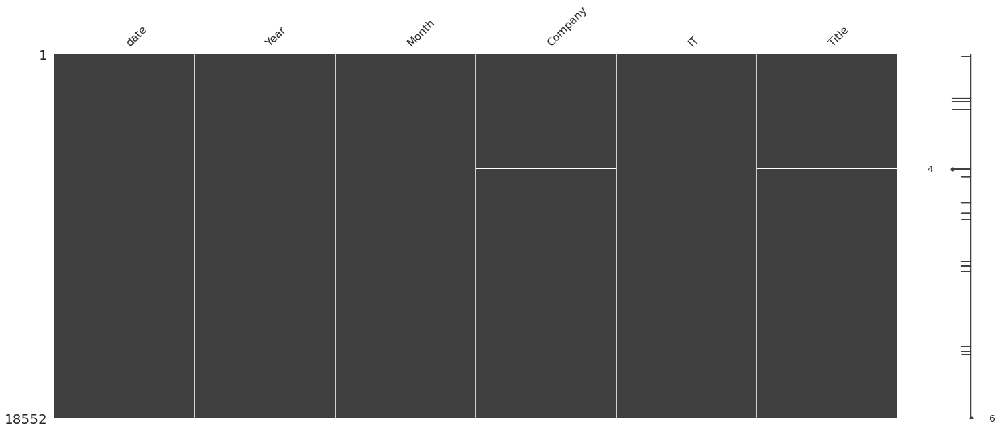

In [137]:
# Visualizing missing data
print (job_titles.shape)
print (job_titles.isnull().sum())
msno.matrix(job_titles)

In [138]:
# Dropping missing rows

print(job_titles.shape)
job_titles= job_titles.dropna()
job_titles= job_titles.reset_index(drop = True)
print(job_titles.shape)
job_titles.isnull().sum()

(18552, 6)
(18533, 6)


date       0
Year       0
Month      0
Company    0
IT         0
Title      0
dtype: int64

In [139]:
titles = job_titles['Title']
titles.head(30)

0                               Chief Financial Officer
1     Full-time Community Connections Intern (paid i...
2                                   Country Coordinator
3                                        BCC Specialist
4                                    Software Developer
5                                            Saleswoman
6                   Chief Accountant/ Finance Assistant
7        Non-paid part or full time Programmatic Intern
8                        Assistant to Managing Director
9                 Program Assistant (INL), FSN-8; FP-6*
10               Short-Term Travel Grants (STG) Program
11     Non-paid part or full time Administrative Intern
12                                 Chief of Party (COP)
13    Community Development, Capacity Building and C...
14                                      General Manager
15                                Network Administrator
16                      Utopian World Championship 2004
17                              Country Economis

In [229]:
job_titles['Company'].unique()

array(['AMERIA Investment Consulting Company',
       'International Research & Exchanges Board (IREX)',
       'Caucasus Environmental NGO Network (CENN)', ...,
       '"HayTech Solutions" LLC', 'NASDAQ OMX Armenia OJSC',
       'Technolinguistics NGO'], dtype=object)

In [ ]:
processed_titles = process_text(titles)
processed_titles

In [143]:
title_cloud = ' '.join(processed_titles)
title_cloud

'chief financial officer full time community connection intern paid internship country coordinator bcc specialist software developer saleswoman chief accountant finance assistant non paid part full time programmatic intern assistant managing director program assistant inl fsn fp short term travel grant stg program non paid part full time administrative intern chief party cop community development capacity building conflict general manager network administrator utopian world championship country economist nob driver logistics assistant graphic designer administrative assistant lawyer marketing advisor chief supervisor program department journalism trainer deputy program director student forum student conference debate forum april reporting diversity workshop journalist chief accountant consultant short term guard fsn fp cc training officer chauffeur fsn fp bb demographic analysis workshop programmer tester receptionist german internship young practicing journalist ni volunteer intern te

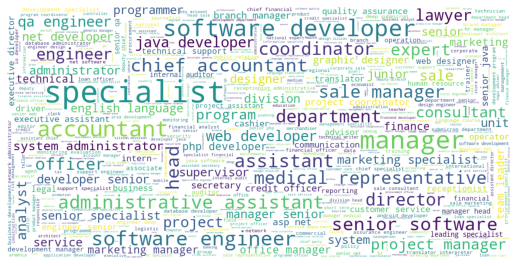

In [227]:
word_cloud(title_cloud, 500)

In [ ]:
bar_cloud(title_cloud, 'Title')

Jobs by Year

In [168]:
# Now concatenating the time variable with corpus created above

titles_by_year = pd.concat([job_titles.date, pd.DataFrame(processed_titles)], axis=1)
titles_by_year.columns = ['date','Titles']
titles_by_year

,date,Titles
0,"Jan 5, 2004",chief financial officer
1,"Jan 7, 2004",full time community connection intern paid int...
2,"Jan 7, 2004",country coordinator
3,"Jan 7, 2004",bcc specialist
4,"Jan 10, 2004",software developer
...,...,...
18528,"Dec 28, 2015",senior creative ux ui designer
18529,"Dec 30, 2015",category development manager
18530,"Dec 30, 2015",operational marketing manager
18531,"Dec 30, 2015",head online sale department


In [170]:
## Now converting the date variable into datetime

titles_by_year['date'] = pd.to_datetime(titles_by_year['date'], errors='coerce')
titles_by_year.dtypes

date      datetime64[ns]
Titles            object
dtype: object

In [175]:
titles_by_year = titles_by_year.set_index('date')
titles_by_year.index.year.value_counts().index.sort_values()

Float64Index([2004.0, 2005.0, 2006.0, 2007.0, 2008.0, 2009.0, 2010.0, 2011.0,
              2012.0, 2013.0, 2014.0, 2015.0],
             dtype='float64')

In [ ]:
for i in titles_by_year.index.year.value_counts().index.sort_values():
  year_titles = titles_by_year.loc[str(int(i))]
  year_titles_cloud = ' '.join(year_titles['Titles'])
  print (str(int(i)))
  word_cloud(year_titles_cloud)

Jobs by IT

In [221]:
# Now concatenating the time variable with corpus created above

titles_by_IT = pd.concat([job_titles.IT, pd.DataFrame(processed_titles)], axis=1)
titles_by_IT.columns = ['IT','Titles']
titles_by_IT['IT'] = titles_by_IT['IT'].replace({False: 'Non-IT', True: 'IT'})
titles_by_IT

,IT,Titles
0,Non-IT,chief financial officer
1,Non-IT,full time community connection intern paid int...
2,Non-IT,country coordinator
3,Non-IT,bcc specialist
4,IT,software developer
...,...,...
18528,Non-IT,senior creative ux ui designer
18529,Non-IT,category development manager
18530,Non-IT,operational marketing manager
18531,Non-IT,head online sale department


In [222]:
titles_by_IT = titles_by_IT.set_index('IT')
titles_by_IT.index

Index(['Non-IT', 'Non-IT', 'Non-IT', 'Non-IT', 'IT', 'Non-IT', 'Non-IT',
       'Non-IT', 'Non-IT', 'Non-IT',
       ...
       'IT', 'IT', 'Non-IT', 'Non-IT', 'Non-IT', 'Non-IT', 'Non-IT', 'Non-IT',
       'Non-IT', 'Non-IT'],
      dtype='object', name='IT', length=18533)

In [225]:
titles_by_IT.index.value_counts().index

Index(['Non-IT', 'IT'], dtype='object')

Non-IT


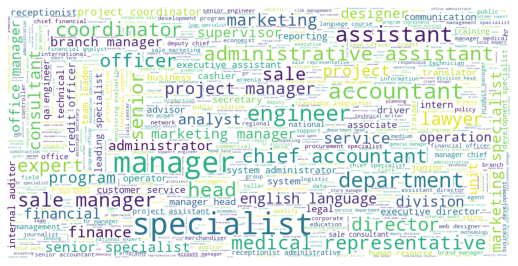

IT


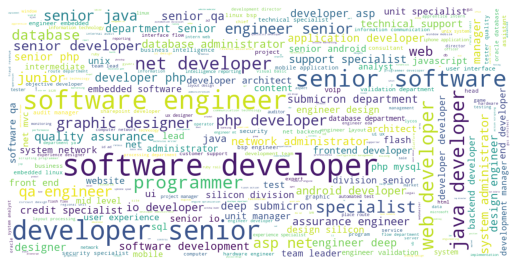

In [226]:
for i in titles_by_IT.index.value_counts().index:
  IT_titles = titles_by_IT.loc[i]
  IT_titles_cloud = ' '.join(IT_titles['Titles'])
  print (i)
  word_cloud(IT_titles_cloud)

Jobs to Company

In [230]:
jobs_by_company = pd.concat([job_titles.Company, pd.DataFrame(processed_titles)], axis=1)
jobs_by_company.columns = ['Company','Titles']
jobs_by_company

,Company,Titles
0,AMERIA Investment Consulting Company,chief financial officer
1,International Research & Exchanges Board (IREX),full time community connection intern paid int...
2,Caucasus Environmental NGO Network (CENN),country coordinator
3,Manoff Group,bcc specialist
4,Yerevan Brandy Company,software developer
...,...,...
18528,Technolinguistics NGO,senior creative ux ui designer
18529,"""Coca-Cola Hellenic Bottling Company Armenia"" ...",category development manager
18530,"""Coca-Cola Hellenic Bottling Company Armenia"" ...",operational marketing manager
18531,San Lazzaro LLC,head online sale department


In [231]:
jobs_by_company = jobs_by_company.set_index('Company')

In [235]:
jobs_by_company.index.value_counts().head(20).index

Index(['ArmenTel CJSC', 'World Vision Armenia',
       'Mentor Graphics Development Services CJSC', 'Ameriabank CJSC',
       'Orange Armenia', 'Converse Bank CJSC', 'SAS Group LLC',
       'Career Center NGO', 'UNDP Armenia Office', 'Central Bank of Armenia',
       'OSCE Office in Yerevan', 'Energize Global Services CJSC',
       'HSBC Bank Armenia CJSC', 'Inecobank CJSC', 'VTB Bank (Armenia) CJSC',
       'Synopsys Armenia', 'Ardshininvestbank CJSC',
       '"Coca-Cola Hellenic Bottling Company Armenia" CJSC', 'Lycos Europe',
       'Boomerang Software LLC'],
      dtype='object')

ArmenTel CJSC

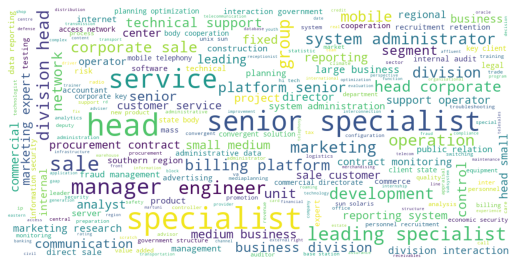

World Vision Armenia

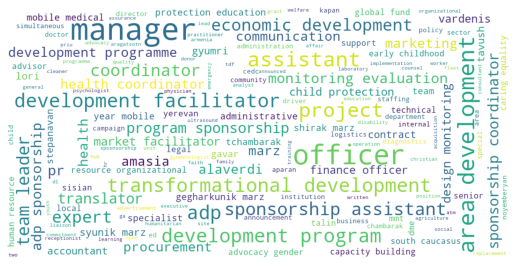

Mentor Graphics Development Services CJSC

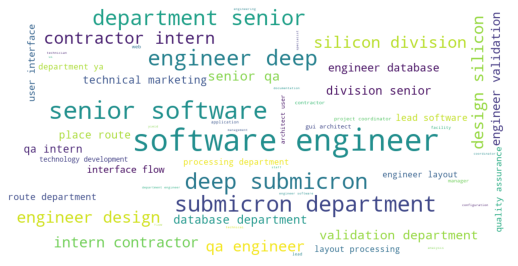

Ameriabank CJSC

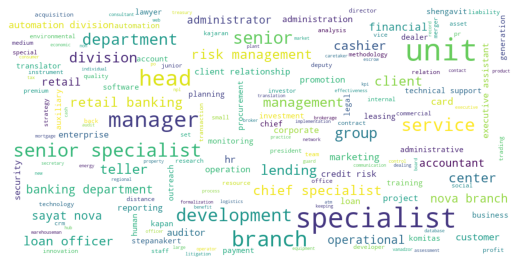

Orange Armenia

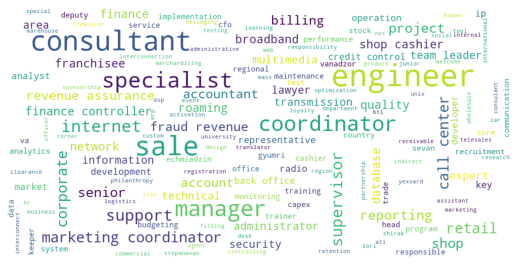

Converse Bank CJSC

KeyboardInterrupt: ignored

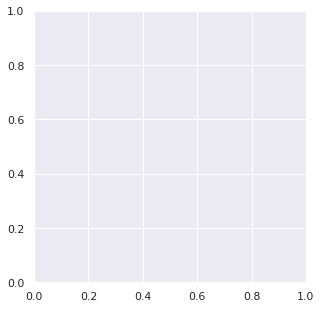

In [238]:
for i in jobs_by_company.index.value_counts().head(20).index:
  company_jobs = jobs_by_company.loc[i]
  company_jobs_cloud = ' '.join(company_jobs['Titles'])
  print (i, end="")
  word_cloud(company_jobs_cloud)

### IDENTIFYING SKILLS REQUIRED BY EMPLOYERS - Job Description

In [123]:
# Making a copy of online_job_data for manipulation and reference
job_description = online_job_data[['date','Year', 'Month', 'Company', 'IT', 'Job_Description']]
print ('Done')

Done


(18552, 6)
date                  0
Year                  0
Month                 0
Company               5
IT                    0
Job_Description    3755
dtype: int64


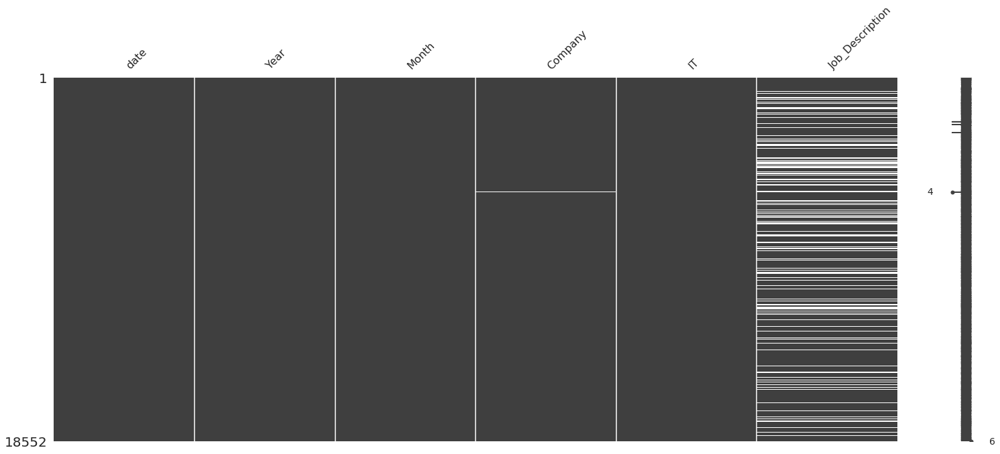

In [124]:
# Visualizing missing data
print (job_description.shape)
print (job_description.isnull().sum())
msno.matrix(job_description)

In [ ]:
# Dropping missing rows

print(job_description.shape)
job_description = job_description.dropna()
job_description = job_description.reset_index(drop = True)
print(job_description.shape)
job_description.isnull().sum()

In [ ]:
job_needs = job_description['Job_Description']
job_needs.head(30)

In [ ]:
processed_needs = process_text(job_needs)
processed_needs

In [157]:
needs_cloud = ' '.join(processed_needs)
needs_cloud

'ameria investment consulting company seeking chief financial officer position manages company fiscal administrative function provides highly responsible technically complex staff assistance executive director work performed requires high level technical proficiency financial management investment management well management supervisory administrative skill public outreach strengthening growing network environmental ngo business international organization public agency serve primary contact cenn public full time position lead local enhancement development health bcc specialist apply state art approach working lgus local government unit ngo help identify address provider caused barrier service provision well identify address support good service delivery developing tool may adapted lgu need work lead staff across component support quality service delivery also monitor implementation improved service delivery lgus provide additional assistance lgus ngo needed collect relevant published gr

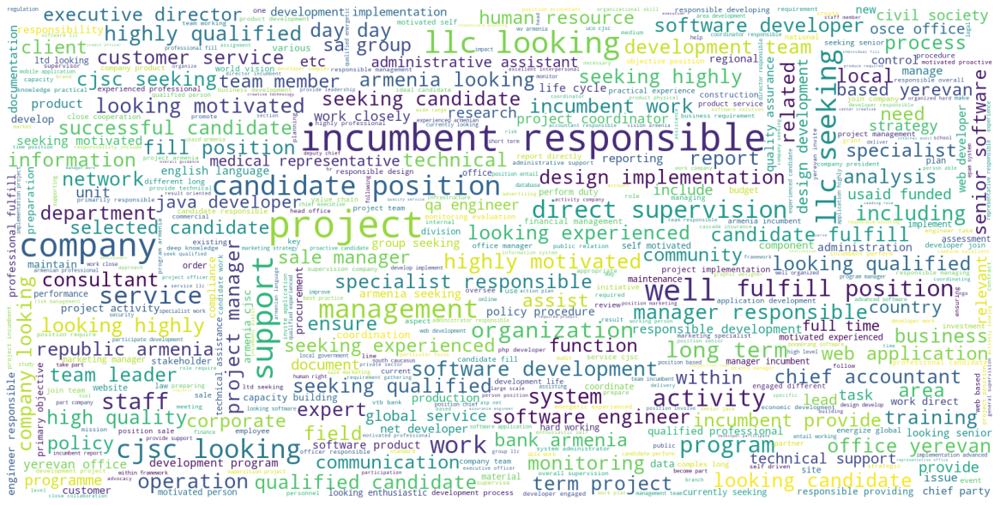

In [158]:
word_cloud(needs_cloud, 500)

<BarContainer object of 10 artists>

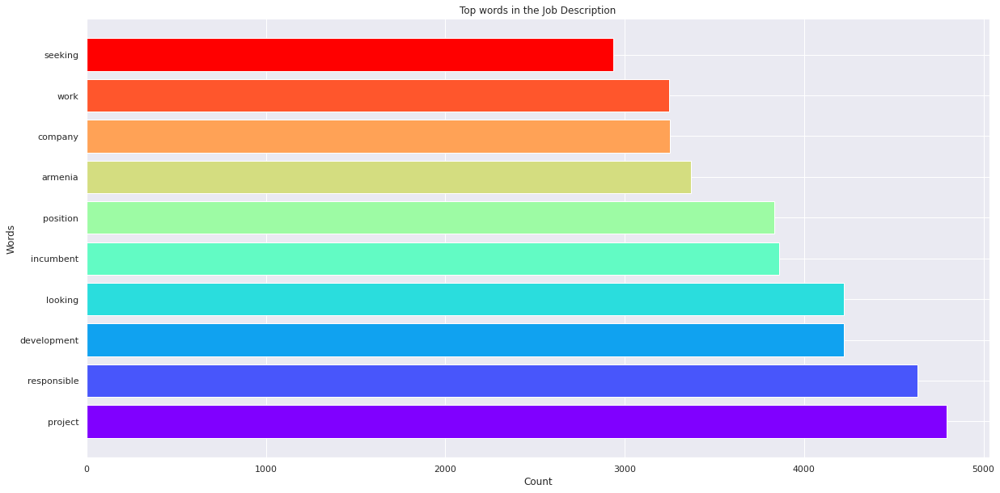

In [159]:
bar_cloud(needs_cloud, 'Job Description')

In [ ]:
# Now concatenating the time variable with corpus created above

C2=pd.concat([job_description.date, pd.DataFrame(corpus2)], axis=1)
C2.columns=['date','corpus2']
C2['corpus2']

In [ ]:
## Now converting the date variable into datetime

C2['date']=pd.to_datetime(C2['date'], errors='coerce')
C2.tail()

In [ ]:
#C2=C2.set_index('date')
C2.tail()
C2['corpus2'].nunique()

In [ ]:
C2.index.year.value_counts()

### IDENTIFYING SKILLS REQUIRED BY EMPLOYERS - Job Requirements

### IDENTIFYING SKILLS REQUIRED BY EMPLOYERS - Required Qualifications